In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
import pytz

In [453]:
pd.set_option('display.max_columns', None)

In [454]:
df = pd.read_csv('us_accidents_stratified_sample.csv')
df.head()

,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,Distance(mi),Street,City,County,State,Zipcode,Timezone,Weather_Timestamp,Temperature(F),Humidity(%),Visibility(mi),Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Junction,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset
0,2,2016-10-24 20:11:40,2016-10-24 20:56:20,34.104397,-118.322472,0.01,US-101 N,Los Angeles,Los Angeles,CA,90028,US/Pacific,2016-10-24 19:47:00,64.9,75.0,10.0,NaN,NaN,Mostly Cloudy,False,False,True,False,False,False,False,True,False,False,False,Night
1,2,2016-10-24 16:27:35,2016-10-24 17:12:18,34.433590,-117.563866,0.00,Yucca Terrace Dr,Phelan,San Bernardino,CA,92371-9830,US/Pacific,2016-10-24 16:01:00,71.6,46.0,10.0,1.2,NaN,Partly Cloudy,False,False,False,False,False,False,False,False,False,False,False,Day
2,2,2016-05-02 21:07:45,2016-05-02 21:52:45,37.187767,-121.688721,0.01,S Valley Fwy N,Morgan Hill,Santa Clara,CA,95037,US/Pacific,2016-05-02 21:15:00,55.4,100.0,10.0,9.2,NaN,Mostly Cloudy,False,False,False,False,False,False,False,False,False,False,False,Night
3,2,2016-06-27 15:45:20,2016-06-27 16:45:20,38.544781,-121.473984,0.00,CA-99 S,Sacramento,Sacramento,CA,95817,US/Pacific,2016-06-27 15:53:00,104.0,12.0,10.0,8.1,NaN,Clear,False,False,False,False,False,False,False,False,False,False,False,Day
4,2,2016-11-29 17:17:32,2016-11-29 18:02:18,34.121311,-117.255951,0.01,Dwight Way,San Bernardino,San Bernardino,CA,92404,US/Pacific,2016-11-29 17:39:00,59.7,22.0,10.0,8.1,NaN,Clear,False,False,False,False,False,False,False,False,False,False,False,Night


In [455]:
df.isna().sum()

Severity                  0
Start_Time                0
End_Time                  0
Start_Lat                 0
Start_Lng                 0
Distance(mi)              0
Street                   18
City                     14
County                    0
State                     0
Zipcode                  12
Timezone                 12
Weather_Timestamp      1643
Temperature(F)         2844
Humidity(%)            3227
Visibility(mi)         3725
Wind_Speed(mph)       38020
Precipitation(in)    176324
Weather_Condition      3348
Amenity                   0
Bump                      0
Crossing                  0
Junction                  0
Railway                   0
Roundabout                0
Station                   0
Stop                      0
Traffic_Calming           0
Traffic_Signal            0
Turning_Loop              0
Sunrise_Sunset           33
dtype: int64

In [456]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 199999 entries, 0 to 199998
Data columns (total 31 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Severity           199999 non-null  int64  
 1   Start_Time         199999 non-null  object 
 2   End_Time           199999 non-null  object 
 3   Start_Lat          199999 non-null  float64
 4   Start_Lng          199999 non-null  float64
 5   Distance(mi)       199999 non-null  float64
 6   Street             199981 non-null  object 
 7   City               199985 non-null  object 
 8   County             199999 non-null  object 
 9   State              199999 non-null  object 
 10  Zipcode            199987 non-null  object 
 11  Timezone           199987 non-null  object 
 12  Weather_Timestamp  198356 non-null  object 
 13  Temperature(F)     197155 non-null  float64
 14  Humidity(%)        196772 non-null  float64
 15  Visibility(mi)     196274 non-null  float64
 16  Wi

In [457]:
df['Start_Time'] = pd.to_datetime(df['Start_Time'])
df['End_Time'] = pd.to_datetime(df['End_Time'])

In [458]:
df['Start_Time'] = df['Start_Time'].dt.tz_localize('UTC')
df['End_Time'] = df['End_Time'].dt.tz_localize('UTC')# Convert to local time per row based on Timezone column
def convert_to_local(row):
    try:
        tz = pytz.timezone(row["Timezone"])
        return row["Start_Time"].tz_localize("UTC").astimezone(tz), row["End_Time"].tz_localize("UTC").astimezone(tz)
    except Exception:
        return row["Start_Time"], row["End_Time"]

df[["Local_Start_Time", "Local_End_Time"]] = df.apply(
    lambda row: pd.Series(convert_to_local(row)), axis=1
)# Convert to local time per row based on Timezone column
def convert_to_local(row):
    try:
        tz = pytz.timezone(row["Timezone"])
        return row["Start_Time"].tz_localize("UTC").astimezone(tz), row["End_Time"].tz_localize("UTC").astimezone(tz)
    except Exception:
        return row["Start_Time"], row["End_Time"]

df[["Local_Start_Time", "Local_End_Time"]] = df.apply(
    lambda row: pd.Series(convert_to_local(row)), axis=1
)

In [459]:
df['Duration'] = df['End_Time'] - df['Start_Time']
df['Duration'] = df['Duration'].dt.total_seconds() / 60

In [460]:
df["Hour"] = df["Start_Time"].dt.hour
df["DayOfWeek"] = df["Start_Time"].dt.day_name()
df["Month"] = df["Start_Time"].dt.month_name()

In [461]:
df.drop(["Start_Time", "End_Time"], inplace=True, axis=1)

In [462]:
severity_counts = df["Severity"].value_counts(normalize=True) * 100
fig = px.pie(values=severity_counts.values, names=severity_counts.index, title='Accident Severity Distribution (%)',
             labels={'label': 'Severity', 'value': 'Percentage'}, hole=0.5, width=500, height=400)
fig.show()

In [463]:
accidents_by_hour = df.groupby("Hour").size()
accidents_by_hour

Hour
0      2422
1      1980
2      2015
3      1642
4      2725
5      3698
6      6330
7     11284
8     13976
9     13531
10    14164
11    14716
12    11688
13     9695
14    10410
15     9255
16    11213
17    12030
18    12017
19    11143
20    10699
21     6281
22     4879
23     2206
dtype: int64

In [464]:
hour_bins = [0, 6, 12, 18, 24]
hour_labels = ['Night', 'Morning', 'Afternoon', 'Evening']
df['Hour_Group'] = pd.cut(df['Hour'], bins=hour_bins, labels=hour_labels, right=False, include_lowest=True)

In [465]:
accidents_by_hour_group = df.groupby('Hour_Group' , observed=True).size().reset_index(name='count').sort_values(ascending=True, by='count')
px.bar(accidents_by_hour_group, y='Hour_Group', x='count', orientation='h')

In [466]:
px.box(df, x='Precipitation(in)')

In [467]:
df[df['Precipitation(in)'] > 2].groupby('City').size()

City
Baton Rouge     1
Brooklyn       31
Hoboken         1
Jersey City    10
New York        7
dtype: int64

In [468]:
df['Precipitation(in)'].describe()

count    23675.000000
mean         0.046806
std          0.458683
min          0.000000
25%          0.000000
50%          0.000000
75%          0.020000
max         10.140000
Name: Precipitation(in), dtype: float64

In [469]:
df['Month_Num'] = pd.to_datetime(df['Month'], format='%B', errors='coerce').dt.month

def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

df['Season'] = df['Month_Num'].apply(get_season)

In [470]:
df.shape

(199999, 38)

In [471]:
print("Before filling:")
print(df['Precipitation(in)'].describe())
print("Null values before:", df['Precipitation(in)'].isna().sum())

df['Precipitation(in)'] = df.groupby(['Season', 'State'])['Precipitation(in)']\
                            .transform(lambda x: x.fillna(x.median()))

print("\nAfter filling:")
print(df['Precipitation(in)'].describe())
print("Null values after:", df['Precipitation(in)'].isna().sum())

Before filling:
count    23675.000000
mean         0.046806
std          0.458683
min          0.000000
25%          0.000000
50%          0.000000
75%          0.020000
max         10.140000
Name: Precipitation(in), dtype: float64
Null values before: 176324

After filling:
count    199999.000000
mean          0.007355
std           0.158521
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          10.140000
Name: Precipitation(in), dtype: float64
Null values after: 0


In [472]:
bins = [0, 0.05, 0.5, 1, 2, 15]  
labels = ['No Rain', 'Light', 'Moderate', 'Heavy', 'upnormal']

df['Precipitation_Bin'] = pd.cut(
    df['Precipitation(in)'], 
    bins=bins, 
    labels=labels, 
    right=False, 
    include_lowest=True
)

In [473]:
accidents_by_hour_group = df.groupby('Precipitation_Bin' , observed=True).size().reset_index(name='count').sort_values(ascending=True, by='count')
px.bar(accidents_by_hour_group, y='Precipitation_Bin', x='count', orientation='h')

In [474]:
df['Timezone'].value_counts()

Timezone
US/Pacific     96912
US/Eastern     68379
US/Central     34343
US/Mountain      353
Name: count, dtype: int64

In [475]:
df.isna().sum()

Severity                 0
Start_Lat                0
Start_Lng                0
Distance(mi)             0
Street                  18
City                    14
County                   0
State                    0
Zipcode                 12
Timezone                12
Weather_Timestamp     1643
Temperature(F)        2844
Humidity(%)           3227
Visibility(mi)        3725
Wind_Speed(mph)      38020
Precipitation(in)        0
Weather_Condition     3348
Amenity                  0
Bump                     0
Crossing                 0
Junction                 0
Railway                  0
Roundabout               0
Station                  0
Stop                     0
Traffic_Calming          0
Traffic_Signal           0
Turning_Loop             0
Sunrise_Sunset          33
Local_Start_Time         0
Local_End_Time           0
Duration                 0
Hour                     0
DayOfWeek                0
Month                    0
Hour_Group               0
Month_Num                0
S

In [476]:
cols_to_check = ['Street', 'City', 'County', 'State', 'Zipcode', 'Timezone']
df = df.dropna(subset=cols_to_check).reset_index(drop=True)
print(df[cols_to_check].isna().sum())

Street      0
City        0
County      0
State       0
Zipcode     0
Timezone    0
dtype: int64


In [477]:
df.drop(['Sunrise_Sunset', 'Zipcode', 'Weather_Timestamp', 'Timezone'], axis=1, inplace=True)

In [478]:
df.duplicated().sum()

np.int64(40)

In [479]:
df.drop_duplicates(inplace=True)

In [480]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 199915 entries, 0 to 199954
Data columns (total 35 columns):
 #   Column             Non-Null Count   Dtype              
---  ------             --------------   -----              
 0   Severity           199915 non-null  int64              
 1   Start_Lat          199915 non-null  float64            
 2   Start_Lng          199915 non-null  float64            
 3   Distance(mi)       199915 non-null  float64            
 4   Street             199915 non-null  object             
 5   City               199915 non-null  object             
 6   County             199915 non-null  object             
 7   State              199915 non-null  object             
 8   Temperature(F)     197083 non-null  float64            
 9   Humidity(%)        196700 non-null  float64            
 10  Visibility(mi)     196202 non-null  float64            
 11  Wind_Speed(mph)    161915 non-null  float64            
 12  Precipitation(in)  199915 non-null 

In [481]:
season_counts = df['Season'].value_counts().reset_index(name='count').sort_index(ascending=False)
px.bar(season_counts, y='Season', x='count')

In [482]:
fig = px.scatter_map(
    df,
    lat="Start_Lat",
    lon="Start_Lng",
    hover_name="City",
    color="Severity",
    zoom=3,
    height=500,
    title="Accident Hotspots (by Severity)"
)
fig.update_layout(mapbox_style="open-street-map")
fig.show()

In [483]:
df.isna().sum()

Severity                 0
Start_Lat                0
Start_Lng                0
Distance(mi)             0
Street                   0
City                     0
County                   0
State                    0
Temperature(F)        2832
Humidity(%)           3215
Visibility(mi)        3713
Wind_Speed(mph)      38000
Precipitation(in)        0
Weather_Condition     3336
Amenity                  0
Bump                     0
Crossing                 0
Junction                 0
Railway                  0
Roundabout               0
Station                  0
Stop                     0
Traffic_Calming          0
Traffic_Signal           0
Turning_Loop             0
Local_Start_Time         0
Local_End_Time           0
Duration                 0
Hour                     0
DayOfWeek                0
Month                    0
Hour_Group               0
Month_Num                0
Season                   0
Precipitation_Bin        0
dtype: int64

In [484]:
df['Temperature(F)'] = df['Temperature(F)'].interpolate()
df['Humidity(%)'] = df['Humidity(%)'].interpolate()
df['Visibility(mi)'] = df['Visibility(mi)'].interpolate()
df['Wind_Speed(mph)'] = df['Wind_Speed(mph)'].interpolate()

In [485]:
df['Weather_Condition'] = df['Weather_Condition'].fillna(df['Weather_Condition'].mode()[0])

<Axes: >

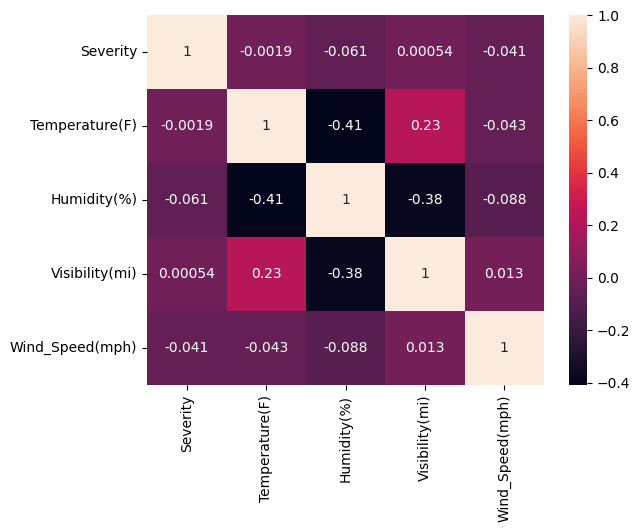

In [486]:
weather_cols = ['Severity', 'Temperature(F)', 'Humidity(%)', 'Visibility(mi)', 'Wind_Speed(mph)']
corr_matrix = df[weather_cols].corr()
sns.heatmap(corr_matrix, annot=True)

In [487]:
temp_bins = [-20, 32, 50, 68, 86, 120]
temp_labels = ['Freezing', 'Cold', 'Mild', 'Warm', 'Hot']
df['Temp_Bin'] = pd.cut(df['Temperature(F)'], bins=temp_bins, labels=temp_labels)

In [488]:
severity_by_temp = (
    df.groupby('Temp_Bin', observed=True)['Severity']
      .agg(lambda x: x.mode()[0])
      .reset_index(name='Most_Common_Severity')
)
severity_by_temp

,Temp_Bin,Most_Common_Severity
0,Freezing,2
1,Cold,2
2,Mild,2
3,Warm,2
4,Hot,2


In [489]:
road_features = [
    'Amenity', 'Bump', 'Crossing', 'Junction', 'Railway', 'Roundabout',
    'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop'
]

In [490]:
feature_counts = (df[road_features].sum() / len(df) * 100).sort_values(ascending=False)
feature_counts

Traffic_Signal     25.665408
Crossing           16.212390
Junction            5.732436
Station             4.142761
Stop                3.754596
Amenity             1.624190
Railway             1.005427
Traffic_Calming     0.102043
Bump                0.033014
Roundabout          0.004502
Turning_Loop        0.000000
dtype: float64

In [491]:
px.bar(x=feature_counts.index, y=feature_counts.values)

In [492]:
# Scatter plot: Duration vs Distance(mi), colored by Severity
px.scatter(
    df, 
    x='Distance(mi)', 
    y='Duration', 
    color='Severity',
    title='Accident Duration vs Distance by Severity',
    labels={'Distance(mi)': 'Distance (miles)', 'Duration': 'Duration (minutes)'},
    opacity=0.5,
    height=500
)

In [493]:
df['DayOfWeek'].value_counts()

DayOfWeek
Tuesday      37353
Wednesday    37177
Thursday     36969
Friday       33339
Monday       33211
Saturday     11589
Sunday       10277
Name: count, dtype: int64

In [494]:
df.to_csv('data.csv')

In [495]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 199915 entries, 0 to 199954
Data columns (total 36 columns):
 #   Column             Non-Null Count   Dtype              
---  ------             --------------   -----              
 0   Severity           199915 non-null  int64              
 1   Start_Lat          199915 non-null  float64            
 2   Start_Lng          199915 non-null  float64            
 3   Distance(mi)       199915 non-null  float64            
 4   Street             199915 non-null  object             
 5   City               199915 non-null  object             
 6   County             199915 non-null  object             
 7   State              199915 non-null  object             
 8   Temperature(F)     199915 non-null  float64            
 9   Humidity(%)        199915 non-null  float64            
 10  Visibility(mi)     199915 non-null  float64            
 11  Wind_Speed(mph)    199914 non-null  float64            
 12  Precipitation(in)  199915 non-null 

In [496]:
# Group accidents by Precipitation_Bin and Severity, then plot
accidents_by_precip_severity = (
    df.groupby(['Weather_Condition', 'Severity'], observed=True)
      .size()
      .reset_index(name='count')
)

px.bar(
    accidents_by_precip_severity.sort_values(ascending=False, by='count'),
    x='Weather_Condition',
    y='count',
    color='Severity',
    barmode='group',
    title='Accident Counts by Precipitation Bin and Severity',
    labels={'count': 'Number of Accidents', 'Precipitation_Bin': 'Precipitation Bin'}
)